<h1 id="tocheading">Table of Contents</h1>
<div id="toc"></div>
<script type="text/javascript" src="https://raw.github.com/kmahelona/ipython_notebook_goodies/master/ipython_notebook_toc.js">

# Picking out the 5 or so interesting sources

For the survey paper, we would like to select 3-5 interesting sources and present some estimates about their properties. Scientifically, what kind of stuff are we interested in finding in the background of our maps?

    1) Lensed Sources
    2) Quasars
    3) Previously undetected DSFGs
    4) Other interesting sources
    
Here, we select a few sources that we are fairly certain about, and begin to explore some of their properties.

In [1]:
# Load in our catalogues of interest. 
# It should be noted that the source extraction algorithm should be run first before running this code.

import numpy as np
import pandas as pd
from astropy import table

pd.set_option('display.notebook_repr_html', True)

def _repr_latex_(self):
    return "\centering{%s}" % self.to_latex()

pd.DataFrame._repr_latex_ = _repr_latex_  # monkey patch pandas DataFrame

# Load in our table and sort by detection strength

my_table = table.Table.read('/media/jgreenslade/New Volume/PhD/Projects/Jingle/Data/Background_Sources/MatchedFilterCat.fits')
my_table = my_table.to_pandas()

my_table.head()


,DEC,Max SNR,N_Pix,RA,SDSS Name,XPixel,YPixel
0,33.168361,4.016387,3,198.860988,J131526.03+330926.0,132,139
1,31.217494,12.352266,11,198.203940,J131258.27+311531.0,167,92
2,0.294972,5.736850,18,180.075000,J120018.00+001741.9,126,122
3,27.871833,5.458526,10,196.651667,J130636.39+275222.6,139,128
4,27.992944,4.585270,7,196.637825,J130636.39+275222.6,150,237


In [2]:
my_table.sort_values('Max SNR', ascending = False, inplace = True)
my_table.head(5)

,DEC,Max SNR,N_Pix,RA,SDSS Name,XPixel,YPixel
1,31.217494,12.352266,11,198.203940,J131258.27+311531.0,167,92
35,31.451609,12.116039,21,204.969765,J133931.82+312657.8,71,131
57,34.140500,11.105389,14,200.146158,J132035.40+340821.7,135,128
48,1.125528,8.292675,17,179.274583,J115705.93+010731.8,124,107
52,34.044414,7.875746,18,203.738811,J133451.23+340319.8,120,108


This gives us five interesting sources which we can take a closer gander at.
Their S2N Suggests they're almost certainly real. 
What would be useful now is to load in the images of these sources and see what they look like.

Actually, given what happens to the first five sources, just select all the sources with more than a 6 sigma detection

In [3]:
sixsigma = my_table['Max SNR'] >= 5
my_table[sixsigma]

,DEC,Max SNR,N_Pix,RA,SDSS Name,XPixel,YPixel
1,31.217494,12.352266,11,198.203940,J131258.27+311531.0,167,92
35,31.451609,12.116039,21,204.969765,J133931.82+312657.8,71,131
57,34.140500,11.105389,14,200.146158,J132035.40+340821.7,135,128
48,1.125528,8.292675,17,179.274583,J115705.93+010731.8,124,107
52,34.044414,7.875746,18,203.738811,J133451.23+340319.8,120,108
53,34.055528,7.800682,22,203.714674,J133451.23+340319.8,138,118
36,31.369412,7.281829,13,204.916334,J133931.82+312657.8,112,57
12,29.579472,6.565770,11,197.757083,J131101.71+293442.0,135,130
23,27.176611,6.472754,14,194.655417,J125837.28+271035.8,134,129
31,33.968889,6.350033,9,198.314289,J131313.45+335903.9,128,115


## Loading in the images

INFO: Setting slices=[0] [aplpy.core]
INFO: Auto-setting vmin to -2.485e+00 [aplpy.core]
INFO: Auto-setting vmax to  2.554e+00 [aplpy.core]
INFO: Setting slices=[0] [aplpy.core]
INFO: Auto-setting vmin to -3.401e+00 [aplpy.core]
INFO: Auto-setting vmax to  3.628e+00 [aplpy.core]
INFO: Setting slices=[0] [aplpy.core]
INFO: Auto-setting vmin to -2.478e+00 [aplpy.core]
INFO: Auto-setting vmax to  2.495e+00 [aplpy.core]
INFO: Setting slices=[0] [aplpy.core]
INFO: Auto-setting vmin to -3.289e+00 [aplpy.core]
INFO: Auto-setting vmax to  3.334e+00 [aplpy.core]
INFO: Setting slices=[0] [aplpy.core]
INFO: Auto-setting vmin to -3.233e+00 [aplpy.core]
INFO: Auto-setting vmax to  3.430e+00 [aplpy.core]
INFO: Setting slices=[0] [aplpy.core]
INFO: Auto-setting vmin to -3.233e+00 [aplpy.core]
INFO: Auto-setting vmax to  3.430e+00 [aplpy.core]
INFO: Setting slices=[0] [aplpy.core]
INFO: Auto-setting vmin to -3.401e+00 [aplpy.core]
INFO: Auto-setting vmax to  3.628e+00 [aplpy.core]
INFO: Setting slices

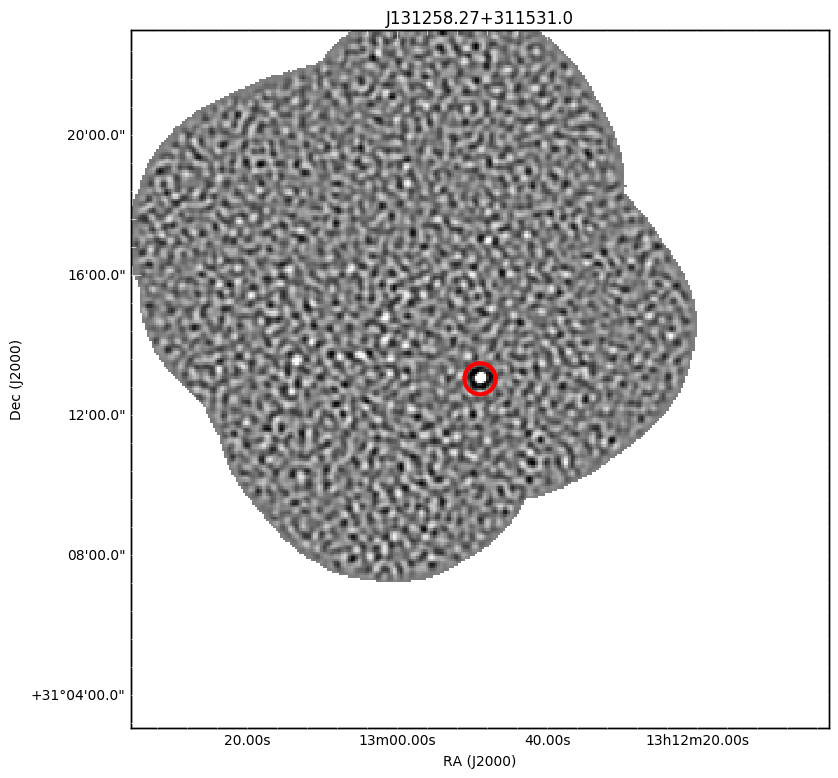

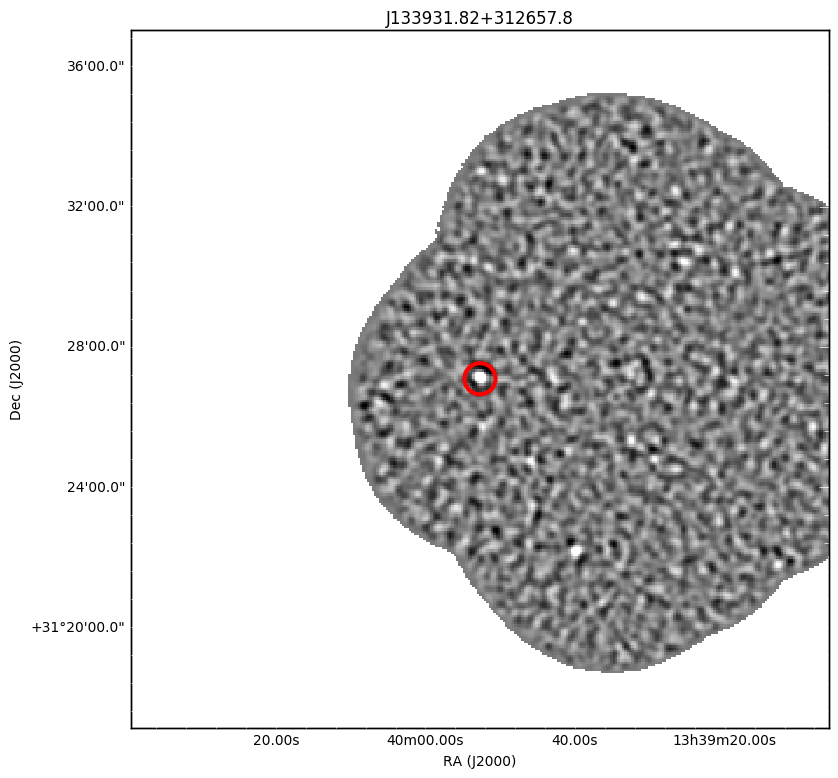

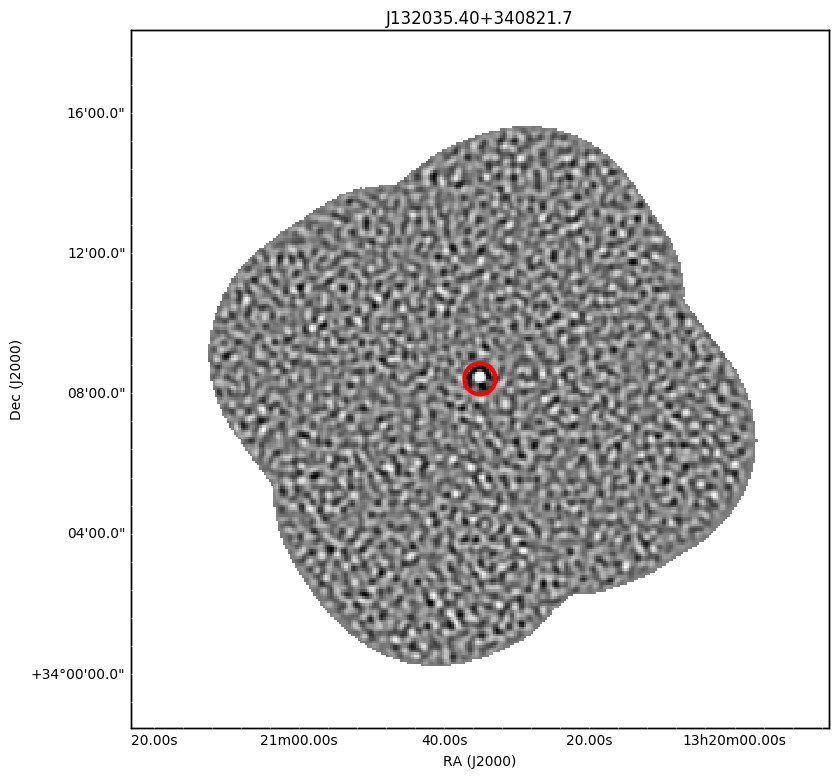

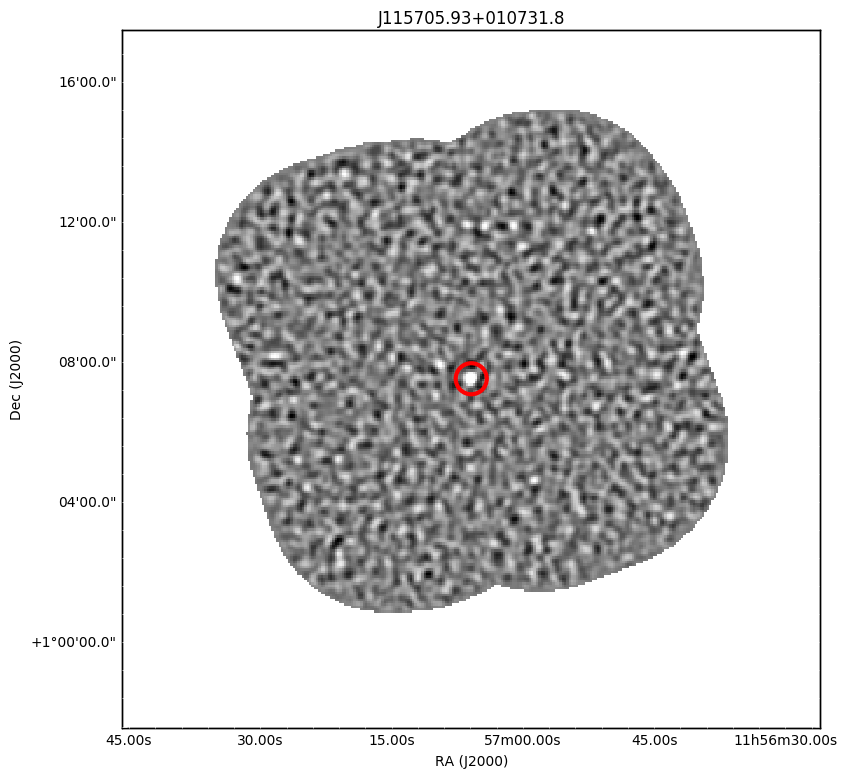

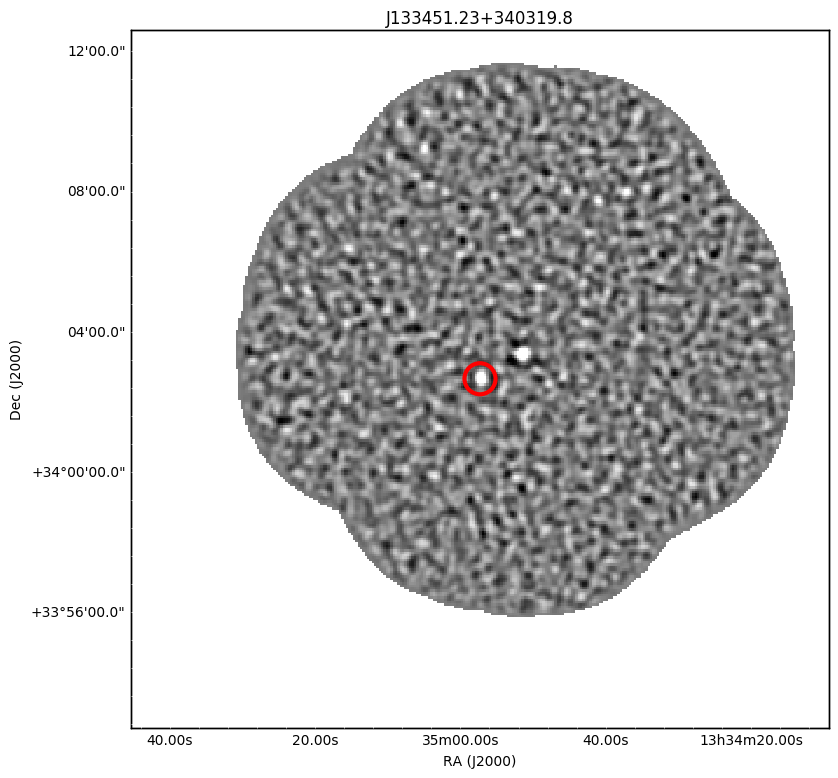

...

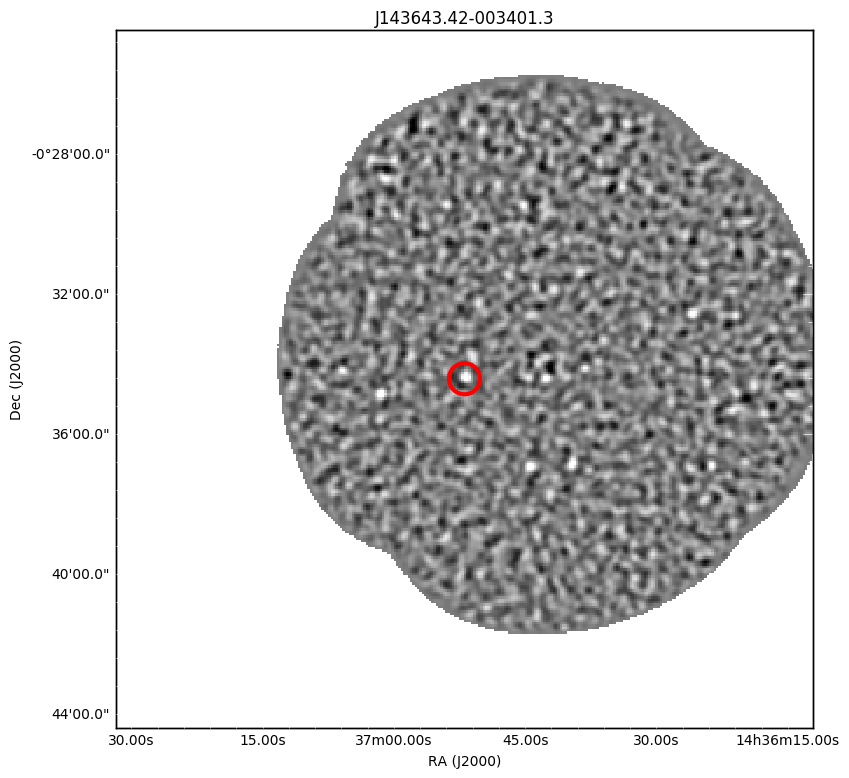

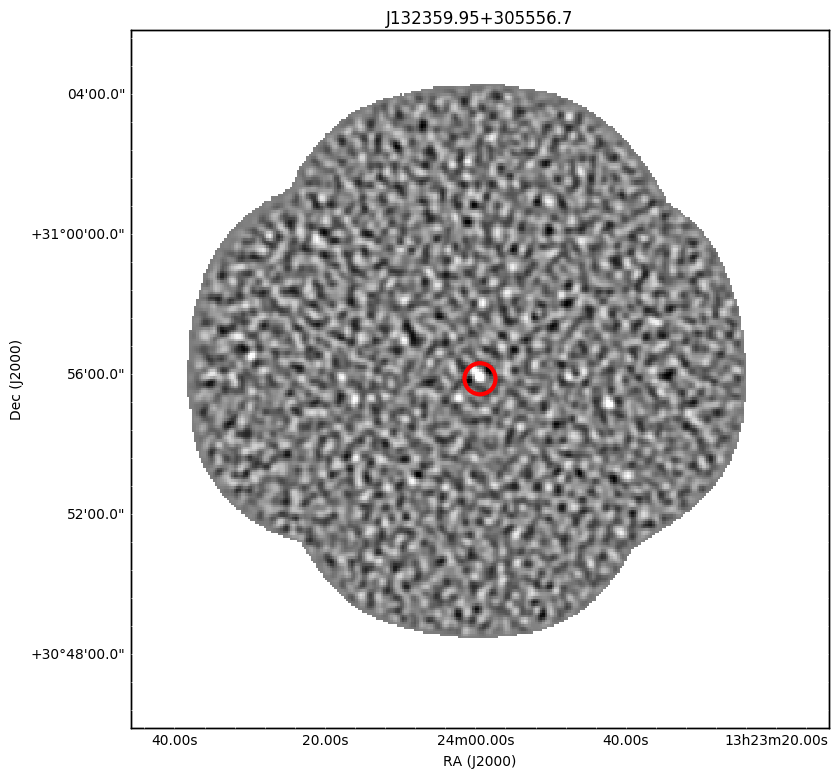

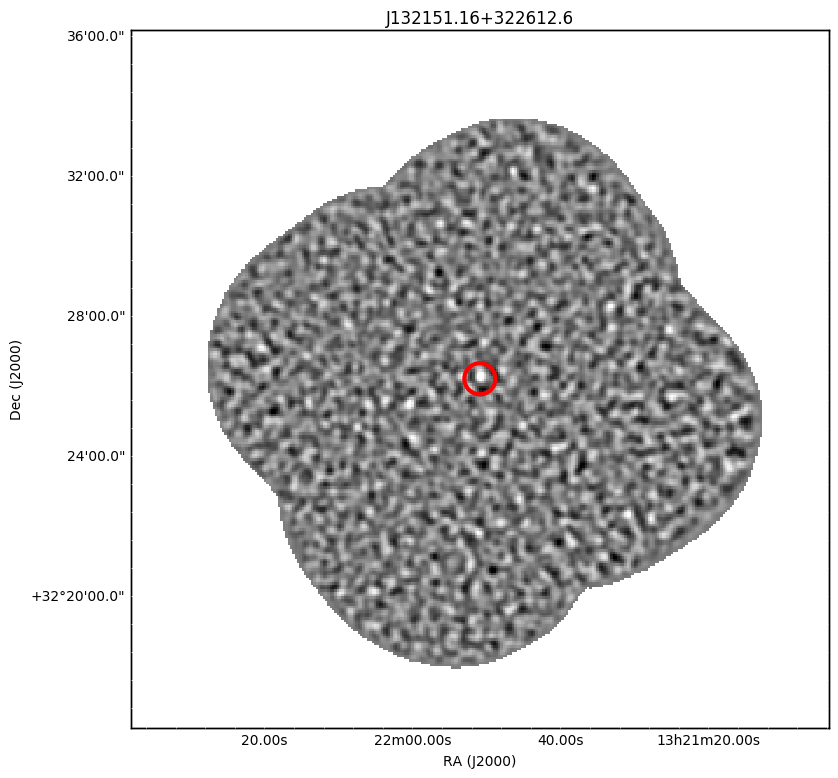

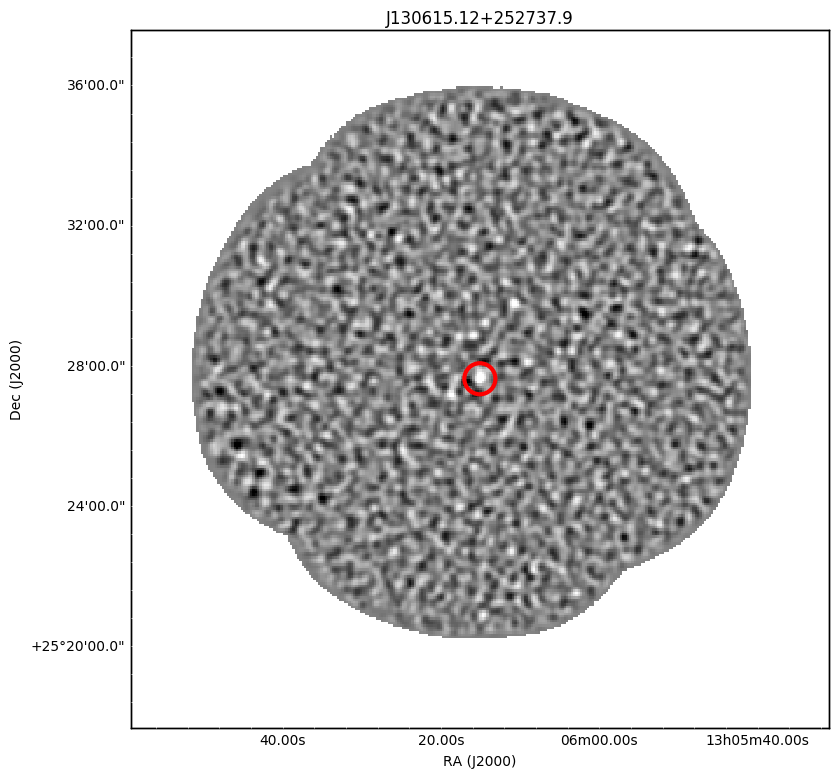

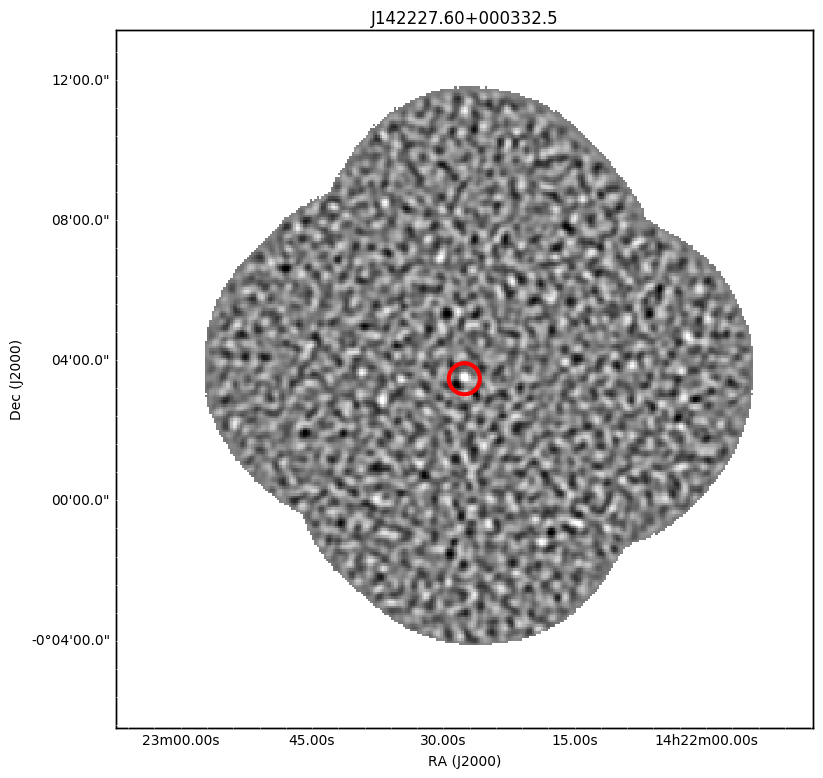

In [4]:
%matplotlib inline

import aplpy
for i in my_table[sixsigma].iterrows():
    i = i[1]
    name  = i['SDSS Name']
    fig = aplpy.FITSFigure('/media/jgreenslade/New Volume/PhD/Projects/Jingle/Data/Background_Sources/' + name + '/zero-mask_mf-snr.fits')#
    fig.recenter(i['RA'], i['DEC'], radius = 0.166)
    fig.show_grayscale()
    fig.show_markers(i['RA'], i['DEC'], s= 500, linewidth = 3)
    fig.set_title(name)

The third and fourth, and maybe even fith objects look like they could be associated with the central galaxy. At this stage it would be worth bringing up the optical image of the source in order to find out what's going on.

INFO: Setting slices=[0] [aplpy.core]
INFO: Auto-setting vmin to -2.485e+00 [aplpy.core]
INFO: Auto-setting vmax to  2.554e+00 [aplpy.core]
INFO: Auto-setting vmin to -1.769e-01 [aplpy.core]
INFO: Auto-setting vmax to  2.379e-01 [aplpy.core]
INFO: Setting slices=[0] [aplpy.core]
INFO: Auto-setting vmin to -3.401e+00 [aplpy.core]
INFO: Auto-setting vmax to  3.628e+00 [aplpy.core]
INFO: Auto-setting vmin to -1.961e-01 [aplpy.core]
INFO: Auto-setting vmax to  2.063e-01 [aplpy.core]
INFO: Setting slices=[0] [aplpy.core]
INFO: Auto-setting vmin to -2.478e+00 [aplpy.core]
INFO: Auto-setting vmax to  2.495e+00 [aplpy.core]
INFO: Auto-setting vmin to -1.943e-01 [aplpy.core]
INFO: Auto-setting vmax to  5.877e-01 [aplpy.core]
INFO: Setting slices=[0] [aplpy.core]
INFO: Auto-setting vmin to -3.289e+00 [aplpy.core]
INFO: Auto-setting vmax to  3.334e+00 [aplpy.core]
INFO: Auto-setting vmin to -1.625e-01 [aplpy.core]
INFO: Auto-setting vmax to  4.379e-01 [aplpy.core]
INFO: Setting slices=[0] [aplpy.

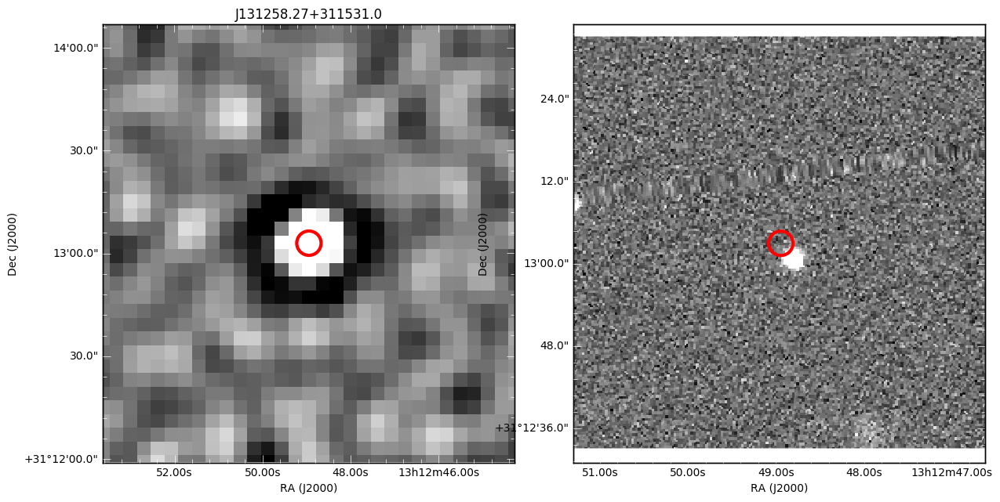

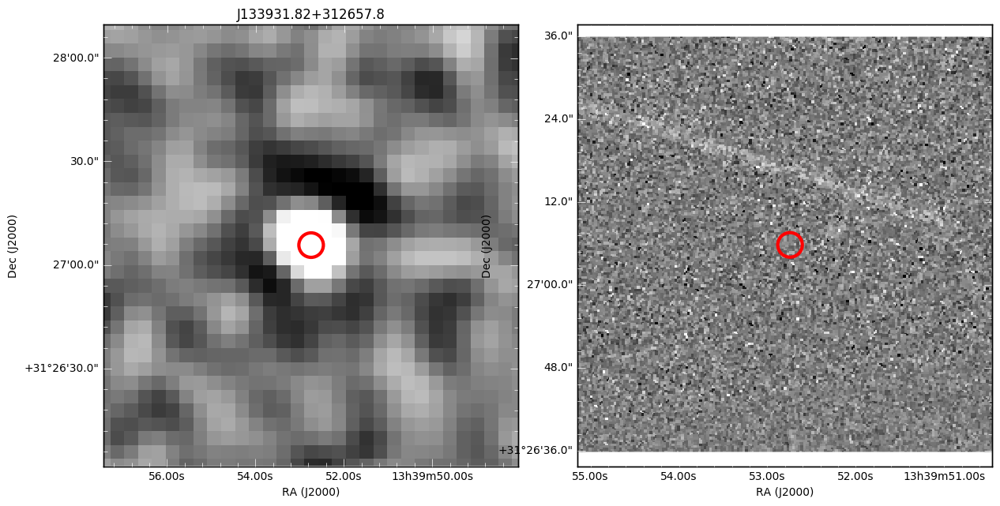

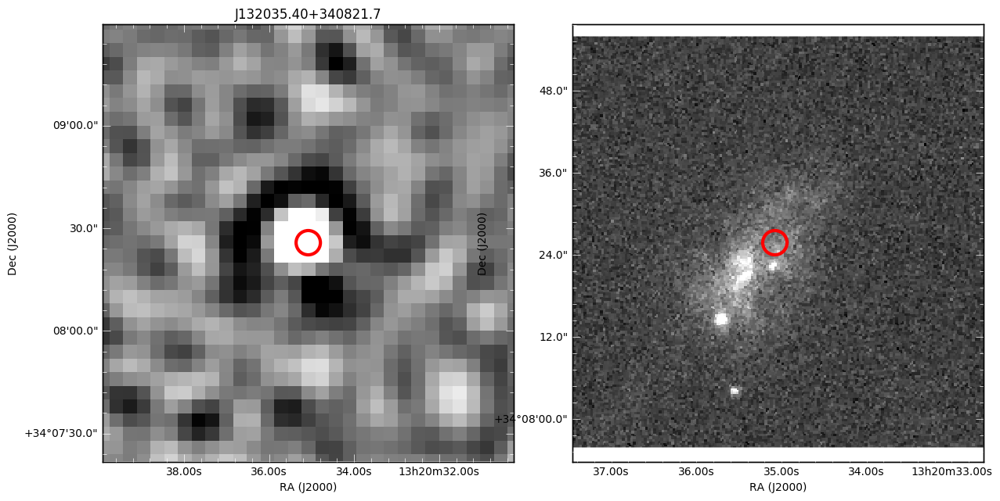

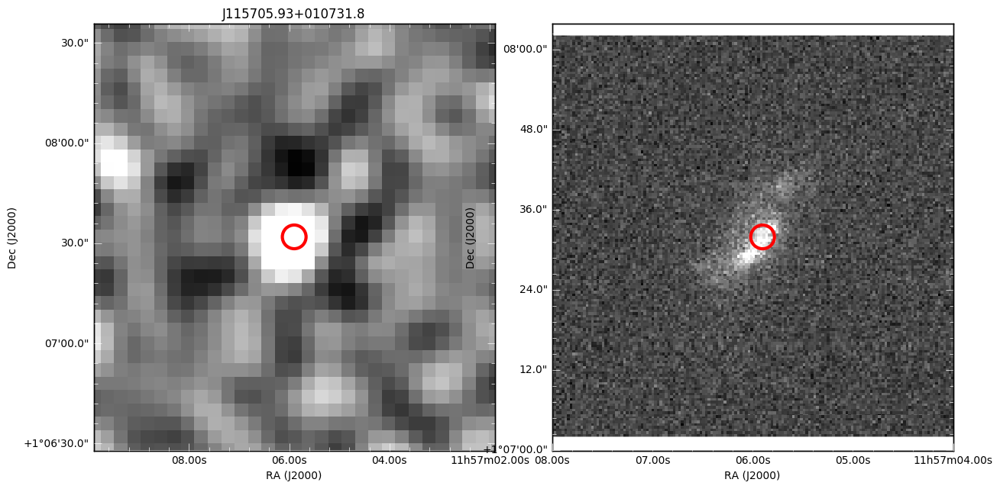

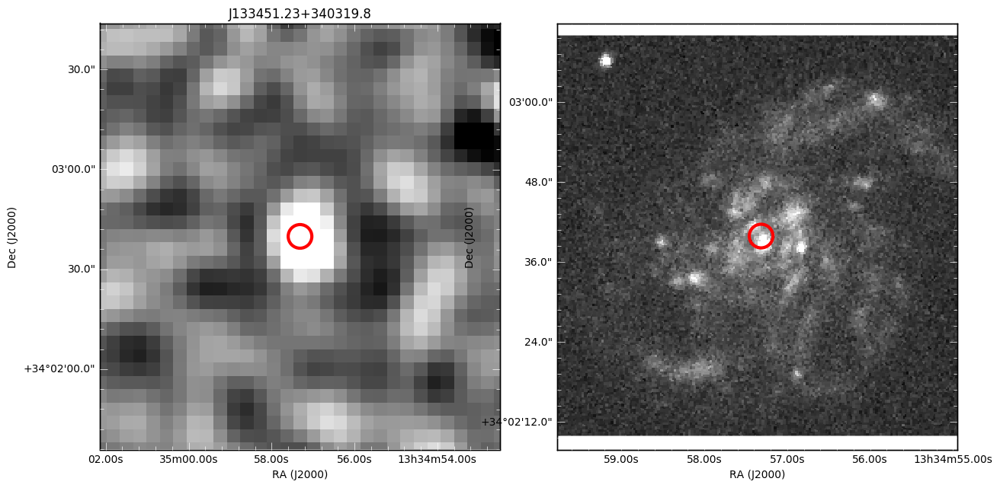

...

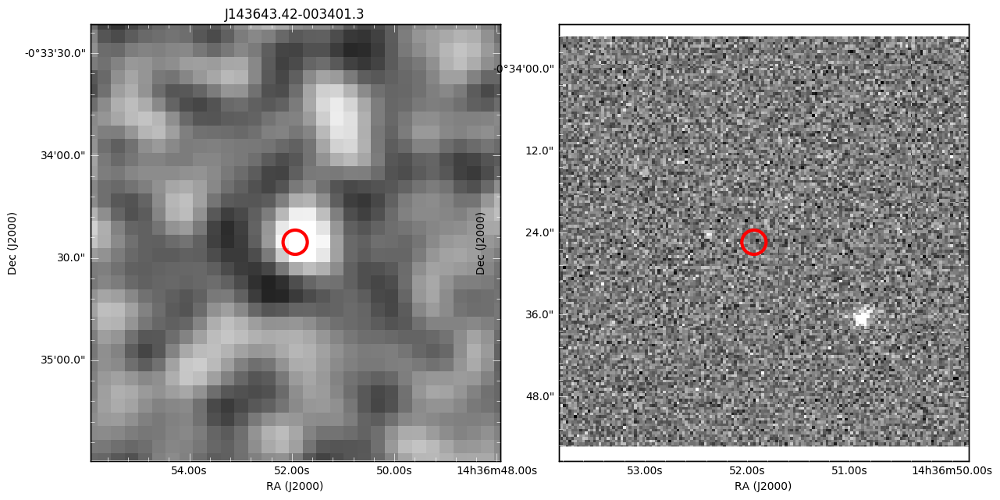

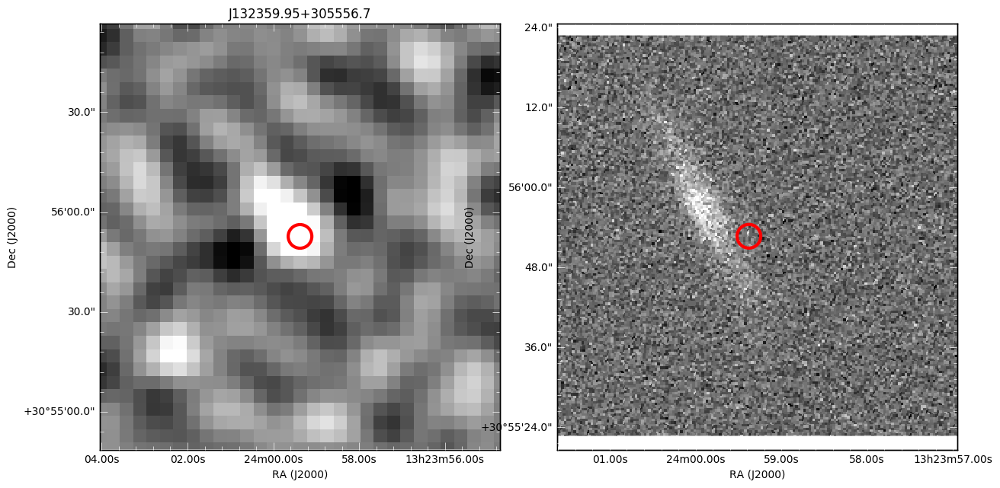

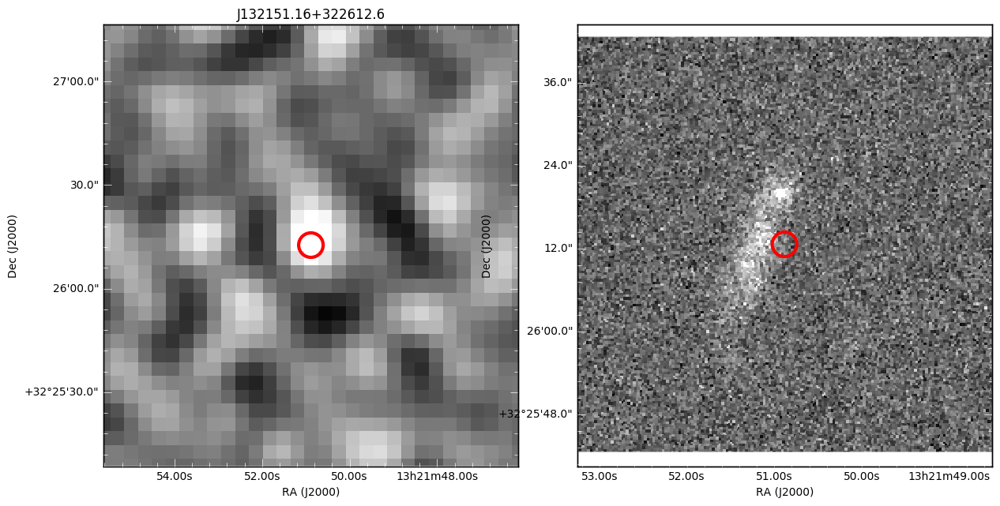

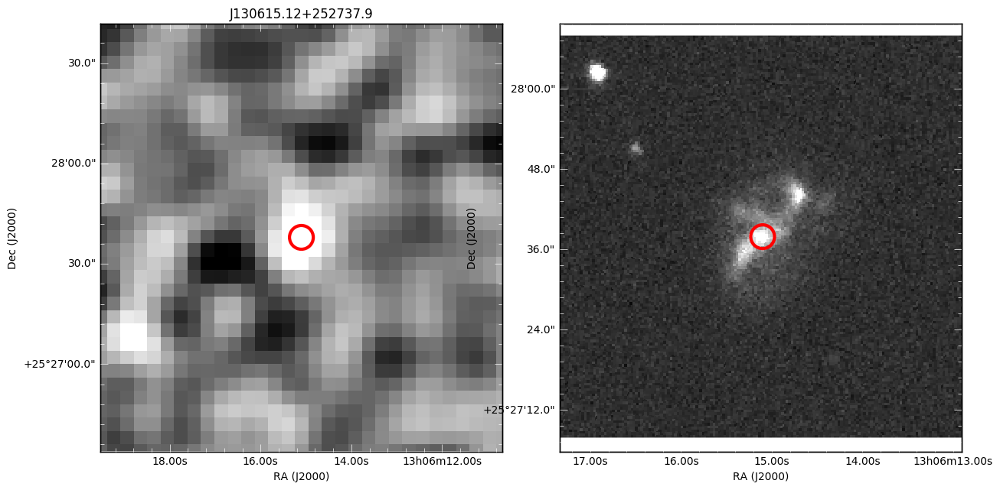

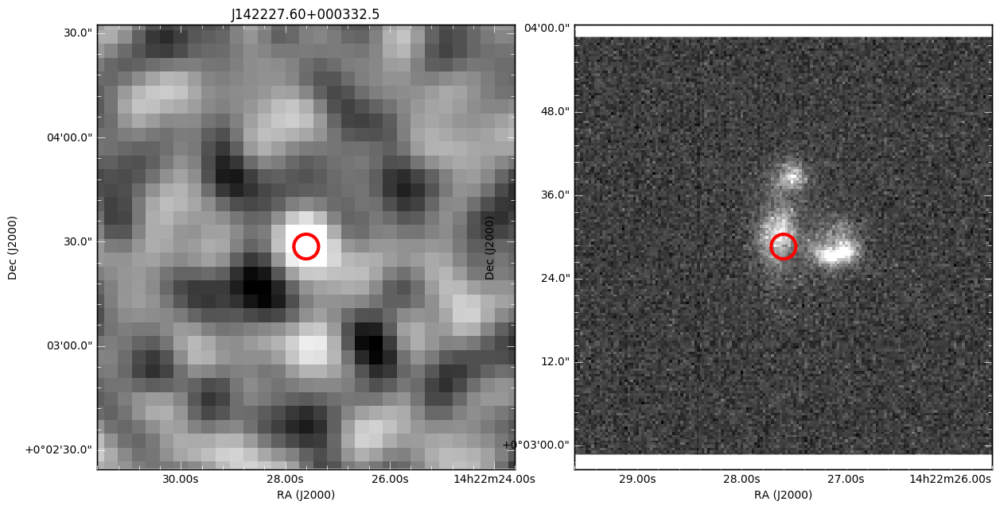

In [5]:
# Import astroquery, as this is really good for viewing sky images

from astroquery.skyview import SkyView
import astropy.units as u
import pylab as plt
import urllib


# Set the radius of the image we want to view in arcminutes
radius = 1 # in arcminutes


# Select a bunch of sources from our table of background sources that we want to examine.
for i in my_table[sixsigma].iterrows():
    i = i[1]
    
    # Set up the figure
    fig = plt.figure(figsize = (15,7))
    
    # Get the Name
    name  = i['SDSS Name']
    
    try:
    # Download the image. Survey can be used to set the survey
        x = SkyView.get_images(position = str(i['RA']) + ' ' + str(i['DEC']),
                           survey = 'SDSSu',
                            radius = radius * u.arcminute)
    except urllib.request.HTTPError:
            f1 = aplpy.FITSFigure( '/media/jgreenslade/New Volume/PhD/Projects/Jingle/Data/Background_Sources/' + name + '/zero-mask_mf-snr.fits',
                            figure=fig, subplot=[0.1,0.1,0.35,0.8])
            print('Missing Image')
            continue

    # Plot the SCUBA2 image
    f1 = aplpy.FITSFigure( '/media/jgreenslade/New Volume/PhD/Projects/Jingle/Data/Background_Sources/' + name + '/zero-mask_mf-snr.fits',
                            figure=fig, subplot=[0.1,0.1,0.35,0.8])
    
    # Plot the survey image
    f2 = aplpy.FITSFigure(x[0], figure=fig, subplot=[0.5,0.1,0.35,0.8])
    
    # Plotty things
    f1.recenter(i['RA'], i['DEC'], radius = radius/60)
    f1.show_grayscale()
    f2.show_grayscale()
    f1.show_markers(i['RA'], i['DEC'], s= 500, linewidth = 3)
    f2.show_markers(i['RA'], i['DEC'], s= 500, linewidth = 3)

    f1.set_title(name)

The second and tenth ones seem to be interesting, lets take a closer look at them.

# Lens Candidates

In [6]:
lens_indexes = [39,40,17, 36, 35, 31]
lens_candidates = my_table.loc[lens_indexes]


In [7]:
my_table.loc[lens_indexes]

,DEC,Max SNR,N_Pix,RA,SDSS Name,XPixel,YPixel
39,-0.581499,5.666081,9,219.256393,J143643.42-003401.3,63,108
40,-0.573722,5.191000,10,219.216391,J143643.42-003401.3,99,115
17,33.485639,5.457885,8,204.164265,J133619.63+332524.3,72,185
36,31.369412,7.281829,13,204.916334,J133931.82+312657.8,112,57
35,31.451609,12.116039,21,204.969765,J133931.82+312657.8,71,131
31,33.968889,6.350033,9,198.314289,J131313.45+335903.9,128,115


INFO: Setting slices=[0] [aplpy.core]
INFO: Auto-setting vmin to -3.372e+00 [aplpy.core]
INFO: Auto-setting vmax to  3.501e+00 [aplpy.core]
INFO: Auto-setting vmin to -6.012e-02 [aplpy.core]
INFO: Auto-setting vmax to  1.489e-01 [aplpy.core]
INFO: Auto-setting vmin to -1.133e-01 [aplpy.core]
INFO: Auto-setting vmax to  3.443e-01 [aplpy.core]
INFO: Auto-setting vmin to -6.847e-01 [aplpy.core]
INFO: Auto-setting vmax to  8.763e-01 [aplpy.core]
INFO: Setting slices=[0] [aplpy.core]
INFO: Auto-setting vmin to -3.372e+00 [aplpy.core]
INFO: Auto-setting vmax to  3.501e+00 [aplpy.core]
INFO: Auto-setting vmin to -6.618e-02 [aplpy.core]
INFO: Auto-setting vmax to  2.169e-01 [aplpy.core]
INFO: Auto-setting vmin to -1.192e-01 [aplpy.core]
INFO: Auto-setting vmax to  3.584e-01 [aplpy.core]
INFO: Auto-setting vmin to -6.830e-01 [aplpy.core]
INFO: Auto-setting vmax to  8.461e-01 [aplpy.core]
INFO: Setting slices=[0] [aplpy.core]
INFO: Auto-setting vmin to -3.173e+00 [aplpy.core]
INFO: Auto-setting 

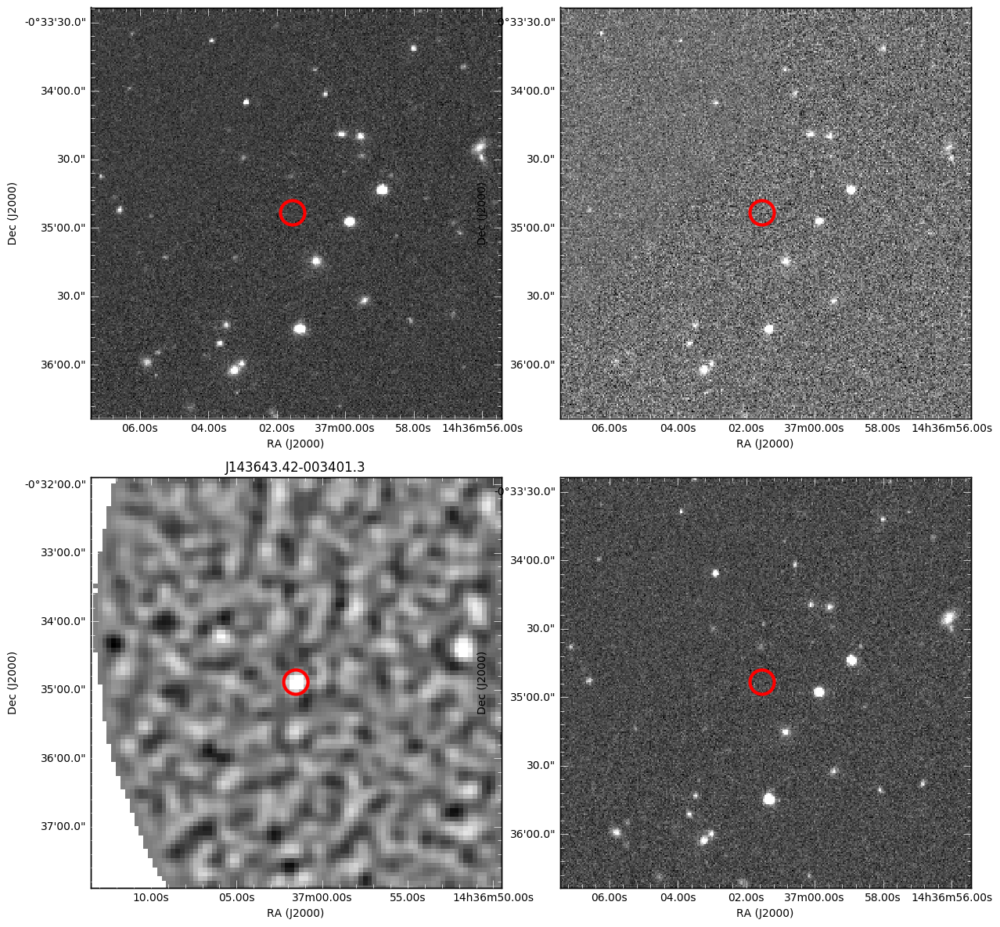

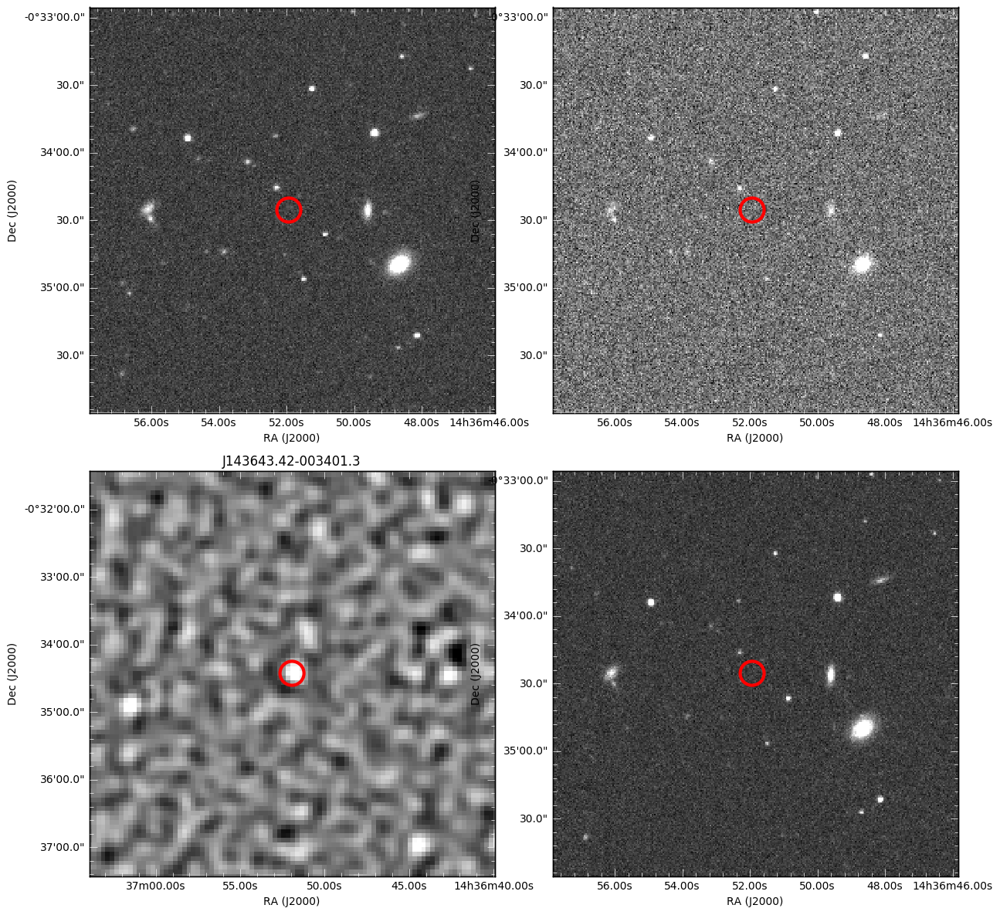

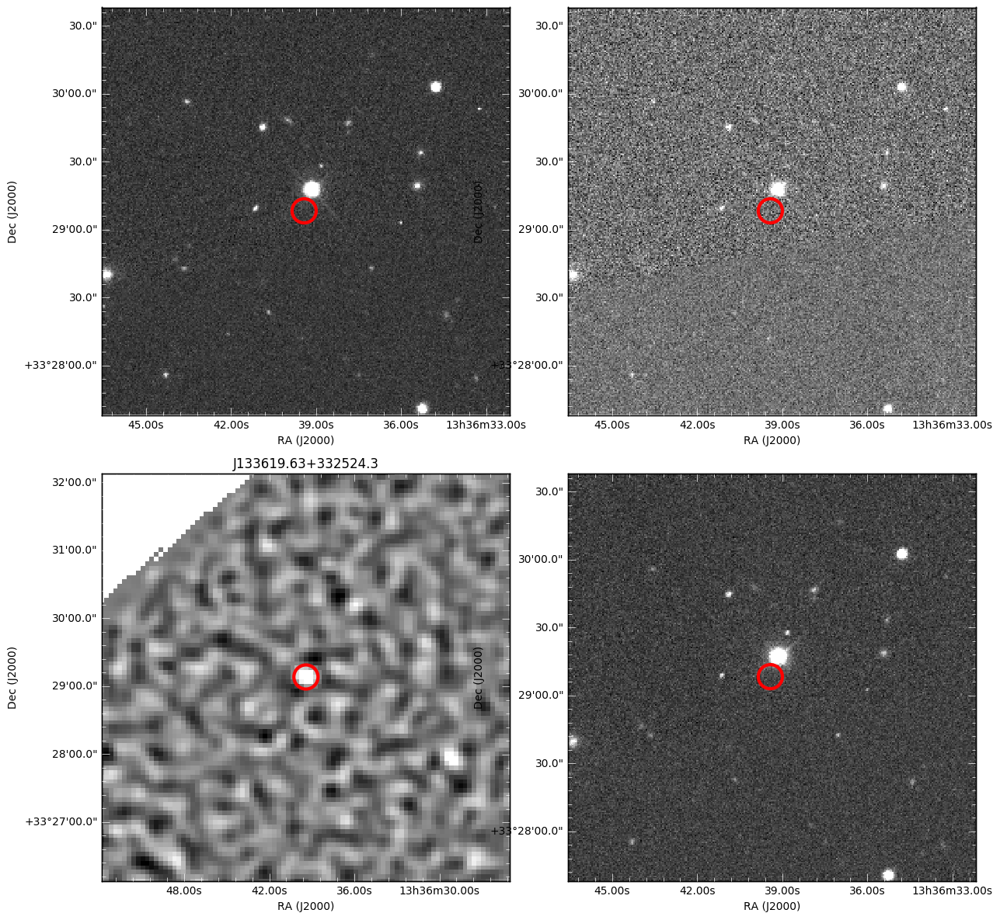

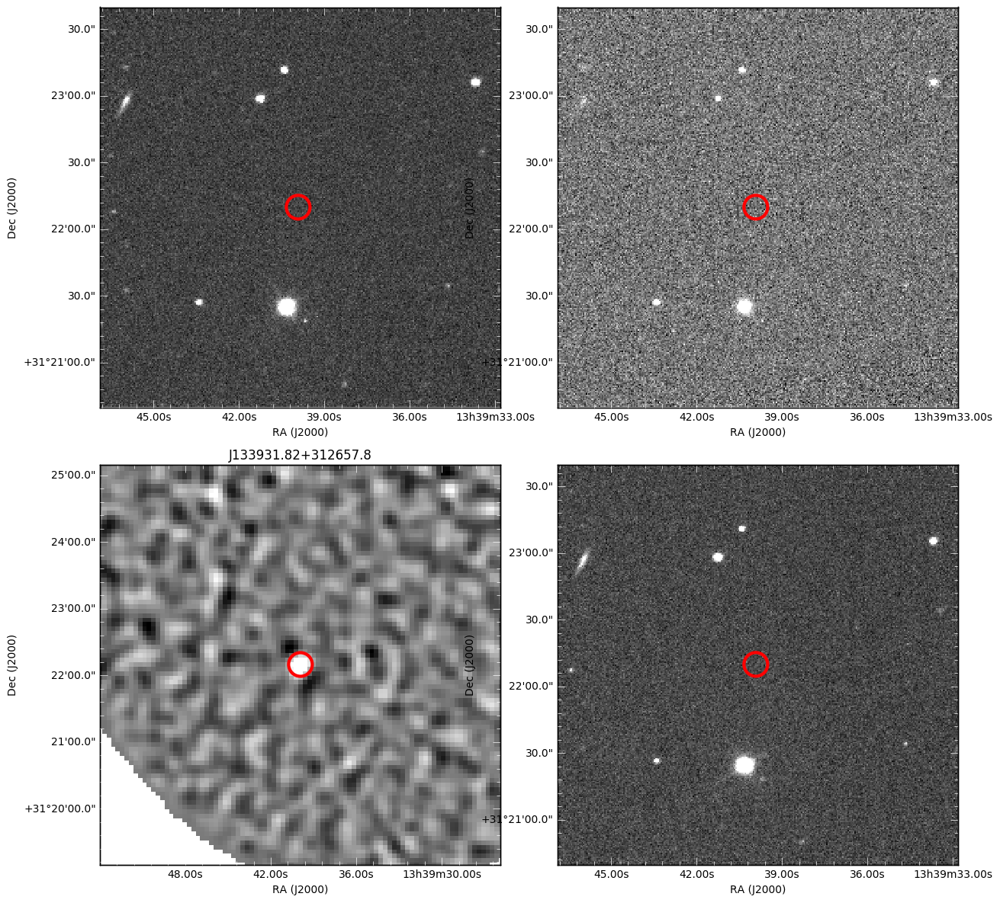

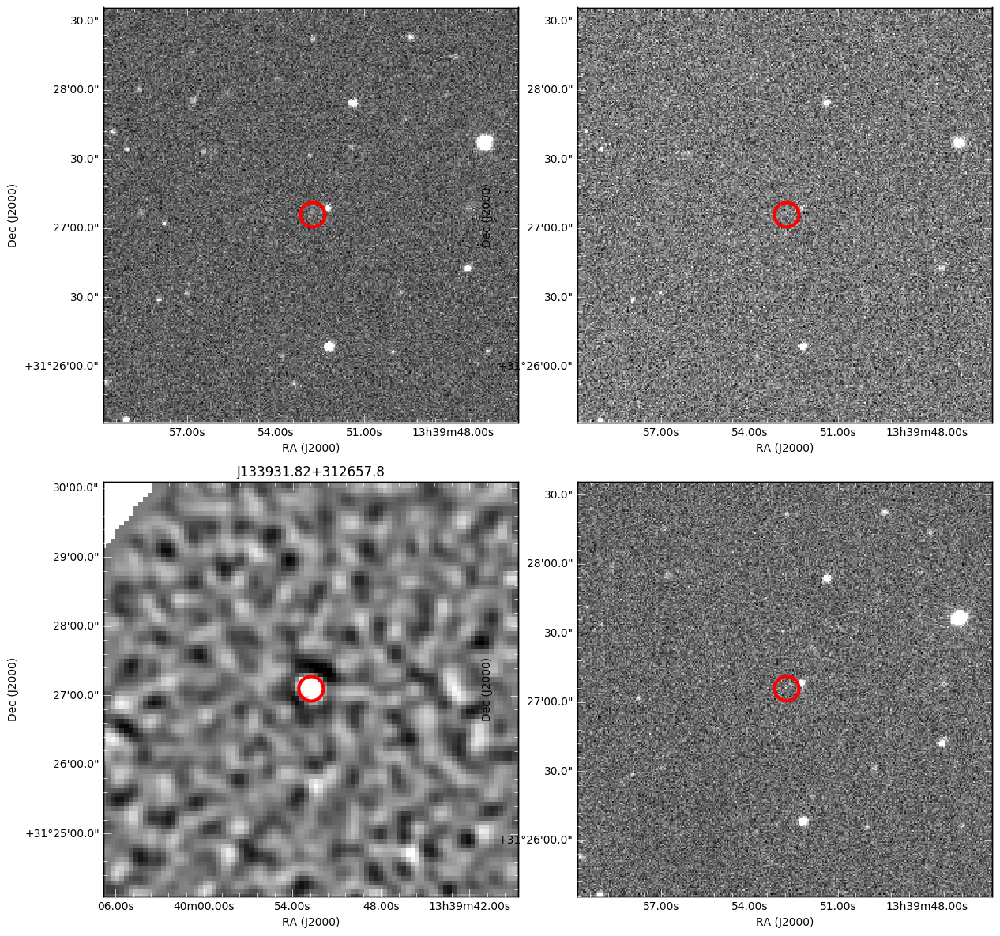

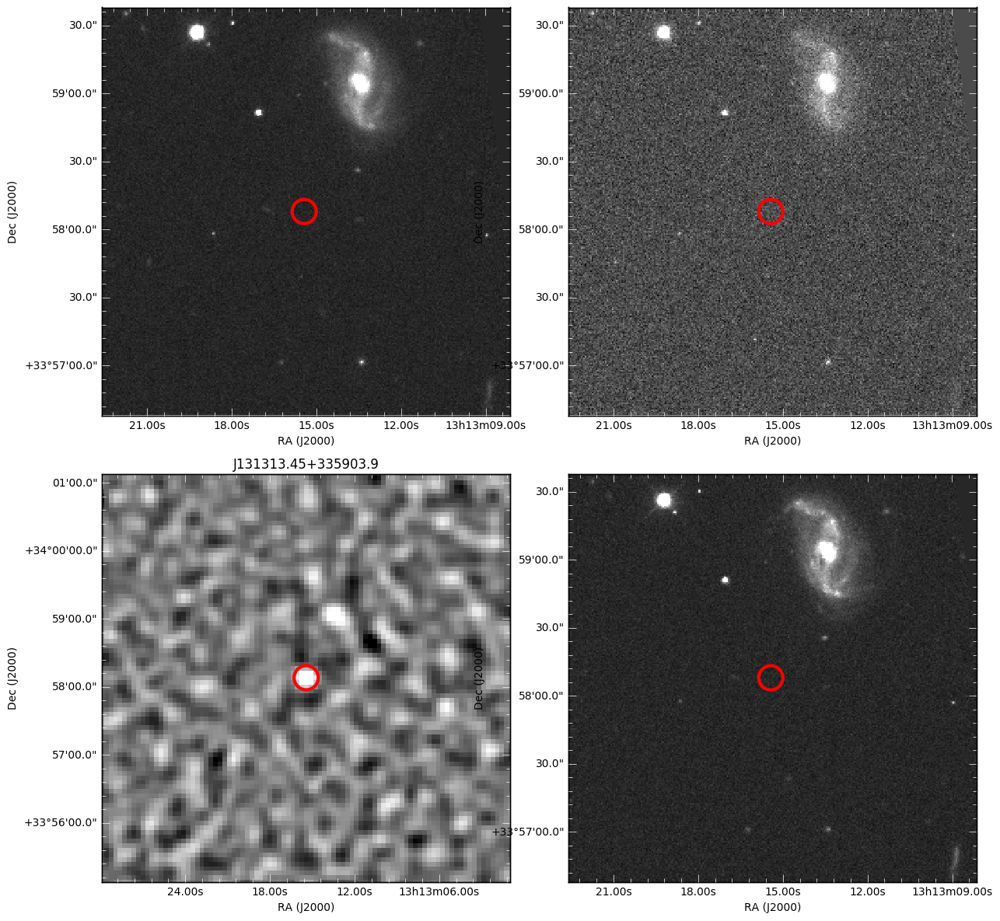

In [8]:
# Look at our lens candidates in more detail
# Import astroquery, as this is really good for viewing sky images

from astroquery.skyview import SkyView
import astropy.units as u
import pylab as plt


# Set the radius of the image we want to view in arcminutes
radius = 3# in arcminutes


for i in my_table.loc[lens_indexes].iterrows():
    i = i[1]
    
    # Set up the figure
    fig = plt.figure(figsize = (15,15))
    
    # Get the Name
    name  = i['SDSS Name']

    # Download the image. Survey can be used to set the survey
    rfig = SkyView.get_images(position = str(i['RA']) + ' ' + str(i['DEC']),
                       survey = 'SDSSg',
                        radius = radius * u.arcminute)
    
    gfig = SkyView.get_images(position = str(i['RA']) + ' ' + str(i['DEC']),
                       survey = 'SDSSr',
                        radius = radius * u.arcminute)
    
    ufig = SkyView.get_images(position = str(i['RA']) + ' ' + str(i['DEC']),
                       survey = 'SDSSz',
                        radius = radius * u.arcminute)
    
    
    # Plot the SCUBA2 image
    f1 = aplpy.FITSFigure( '/media/jgreenslade/New Volume/PhD/Projects/Jingle/Data/Background_Sources/' + name + '/zero-mask_mf-snr.fits',
                            figure=fig, subplot=[0.1,0.1,0.35,0.35])
    
    # Plot the survey images
    f2 = aplpy.FITSFigure(rfig[0], figure=fig, subplot=[0.5,0.1,0.35,0.35])
    f3 = aplpy.FITSFigure(gfig[0], figure=fig, subplot=[0.1,0.5,0.35,0.35])
    f4 = aplpy.FITSFigure(ufig[0], figure=fig, subplot=[0.5,0.5,0.35,0.35])
    
    # Plotty things
    f1.recenter(i['RA'], i['DEC'], radius = radius/60)
    f1.show_grayscale()
    f2.show_grayscale()
    f3.show_grayscale()
    f4.show_grayscale()
    f1.show_markers(i['RA'], i['DEC'], s= 500, linewidth = 3)
    f2.show_markers(i['RA'], i['DEC'], s= 500, linewidth = 3)
    f3.show_markers(i['RA'], i['DEC'], s= 500, linewidth = 3)
    f4.show_markers(i['RA'], i['DEC'], s= 500, linewidth = 3)


    f1.set_title(name)

J133931 might have something nearby it? Putting this position into NED yields not much nearby it. These three could be candidate lensed galaxies? To examine this further, let's look at the Herschel maps to determine their colour

# Herschel maps of lens candidates

All of the objects appear to be in the NGP field

In [9]:
lens_candidates

,DEC,Max SNR,N_Pix,RA,SDSS Name,XPixel,YPixel
39,-0.581499,5.666081,9,219.256393,J143643.42-003401.3,63,108
40,-0.573722,5.191000,10,219.216391,J143643.42-003401.3,99,115
17,33.485639,5.457885,8,204.164265,J133619.63+332524.3,72,185
36,31.369412,7.281829,13,204.916334,J133931.82+312657.8,112,57
35,31.451609,12.116039,21,204.969765,J133931.82+312657.8,71,131
31,33.968889,6.350033,9,198.314289,J131313.45+335903.9,128,115


So we can load in those maps and extract the fluxes at these positions.

INFO: Auto-setting vmin to -2.029e-02 [aplpy.core]
INFO: Auto-setting vmax to  4.579e-02 [aplpy.core]


INFO: Auto-setting vmin to -2.153e-02 [aplpy.core]
INFO: Auto-setting vmax to  4.276e-02 [aplpy.core]


INFO: Auto-setting vmin to -2.412e-02 [aplpy.core]
INFO: Auto-setting vmax to  3.890e-02 [aplpy.core]


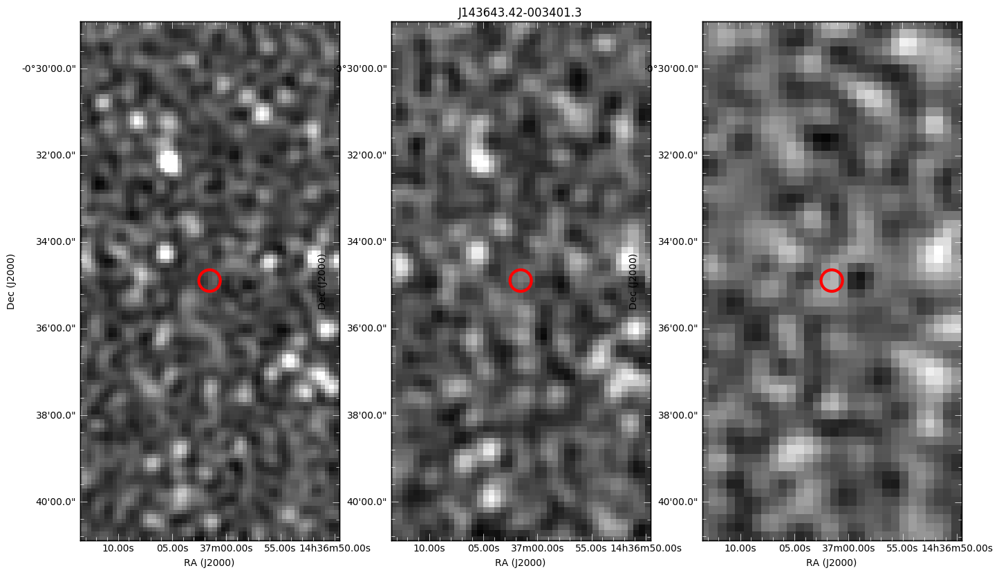

In [10]:
# Set up the locations of the maps

loc_250_NGP = '/media/jgreenslade/New Volume/PhD/Projects/Jingle/Data/H-ATLAS/NGP_fbacksub_250_c.fits'
loc_350_NGP = '/media/jgreenslade/New Volume/PhD/Projects/Jingle/Data/H-ATLAS/NGP_fbacksub_350_c.fits'
loc_500_NGP = '/media/jgreenslade/New Volume/PhD/Projects/Jingle/Data/H-ATLAS/NGP_fbacksub_500_c.fits'

loc_250_G09 = '/media/jgreenslade/New Volume/PhD/Projects/Jingle/Data/H-ATLAS/HATLAS_GAMA9_DR1_FILT_BACKSUB250.FITS'
loc_350_G09 = '/media/jgreenslade/New Volume/PhD/Projects/Jingle/Data/H-ATLAS/HATLAS_GAMA9_DR1_FILT_BACKSUB350.FITS'
loc_500_G09 = '/media/jgreenslade/New Volume/PhD/Projects/Jingle/Data/H-ATLAS/HATLAS_GAMA9_DR1_FILT_BACKSUB500.FITS'

loc_250_G12 = '/media/jgreenslade/New Volume/PhD/Projects/Jingle/Data/H-ATLAS/HATLAS_GAMA12_DR1_FILT_BACKSUB250.FITS'
loc_350_G12 = '/media/jgreenslade/New Volume/PhD/Projects/Jingle/Data/H-ATLAS/HATLAS_GAMA12_DR1_FILT_BACKSUB350.FITS'
loc_500_G12 = '/media/jgreenslade/New Volume/PhD/Projects/Jingle/Data/H-ATLAS/HATLAS_GAMA12_DR1_FILT_BACKSUB500.FITS'

loc_250_G15 = '/media/jgreenslade/New Volume/PhD/Projects/Jingle/Data/H-ATLAS/HATLAS_GAMA15_DR1_FILT_BACKSUB250.FITS'
loc_350_G15 = '/media/jgreenslade/New Volume/PhD/Projects/Jingle/Data/H-ATLAS/HATLAS_GAMA15_DR1_FILT_BACKSUB350.FITS'
loc_500_G15 = '/media/jgreenslade/New Volume/PhD/Projects/Jingle/Data/H-ATLAS/HATLAS_GAMA15_DR1_FILT_BACKSUB500.FITS'


# For each figure, load it in and re-centre at the position of the lens candidate

a = 0
# For each figure, load it in and re-centre at the position of the lens candidate

fig = plt.figure(figsize=(15,15))

fig1 = aplpy.FITSFigure(loc_250_G15, figure=fig, subplot=[0.1,0.1,0.25,0.5])
fig1.recenter(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], radius = radius/60)
fig1.show_grayscale()
fig1.show_markers(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], s= 500, linewidth = 3)

fig2 = aplpy.FITSFigure(loc_350_G15, figure=fig, subplot=[0.4,0.1,0.25,0.5])
fig2.recenter(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], radius = radius/60)
fig2.show_grayscale()
fig2.show_markers(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], s= 500, linewidth = 3)

fig3 = aplpy.FITSFigure(loc_500_G15, figure=fig, subplot=[0.7,0.1,0.25,0.5])
fig3.recenter(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], radius = radius/60)
fig3.show_grayscale()
fig3.show_markers(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], s= 500, linewidth = 3)

fig2.set_title(lens_candidates.iloc[a]['SDSS Name'])

INFO: Auto-setting vmin to -2.029e-02 [aplpy.core]
INFO: Auto-setting vmax to  4.579e-02 [aplpy.core]


INFO: Auto-setting vmin to -2.153e-02 [aplpy.core]
INFO: Auto-setting vmax to  4.276e-02 [aplpy.core]


INFO: Auto-setting vmin to -2.412e-02 [aplpy.core]
INFO: Auto-setting vmax to  3.890e-02 [aplpy.core]


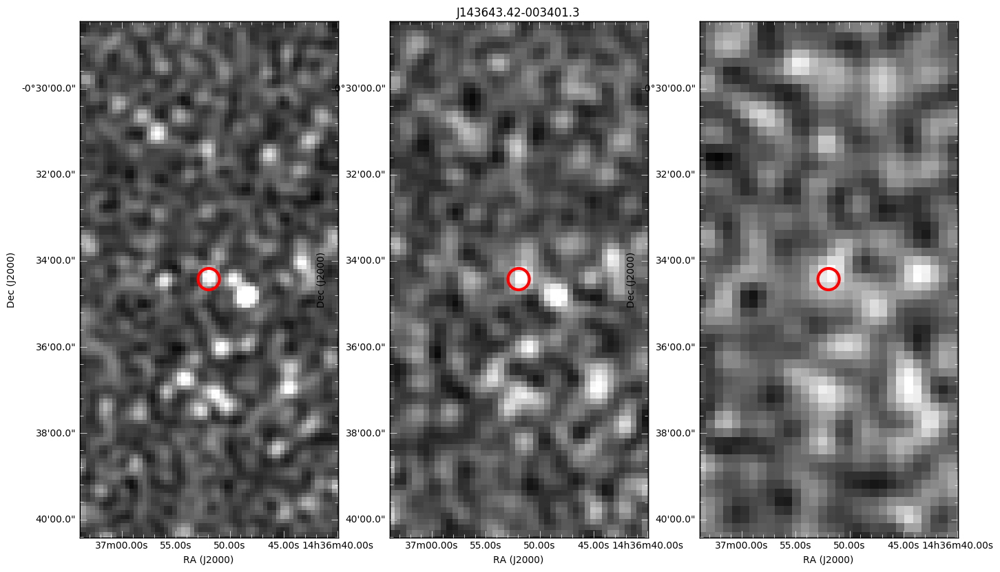

In [11]:
a = 1
# For each figure, load it in and re-centre at the position of the lens candidate

fig = plt.figure(figsize=(15,15))

fig1 = aplpy.FITSFigure(loc_250_G15, figure=fig, subplot=[0.1,0.1,0.25,0.5])
fig1.recenter(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], radius = radius/60)
fig1.show_grayscale()
fig1.show_markers(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], s= 500, linewidth = 3)

fig2 = aplpy.FITSFigure(loc_350_G15, figure=fig, subplot=[0.4,0.1,0.25,0.5])
fig2.recenter(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], radius = radius/60)
fig2.show_grayscale()
fig2.show_markers(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], s= 500, linewidth = 3)

fig3 = aplpy.FITSFigure(loc_500_G15, figure=fig, subplot=[0.7,0.1,0.25,0.5])
fig3.recenter(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], radius = radius/60)
fig3.show_grayscale()
fig3.show_markers(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], s= 500, linewidth = 3)

fig2.set_title(lens_candidates.iloc[a]['SDSS Name'])

Very clearly something there, looks like a potential 500 riser?

INFO: Auto-setting vmin to -2.319e-02 [aplpy.core]
INFO: Auto-setting vmax to  6.127e-02 [aplpy.core]


INFO: Auto-setting vmin to -2.556e-02 [aplpy.core]
INFO: Auto-setting vmax to  5.686e-02 [aplpy.core]


INFO: Auto-setting vmin to -2.779e-02 [aplpy.core]
INFO: Auto-setting vmax to  4.895e-02 [aplpy.core]


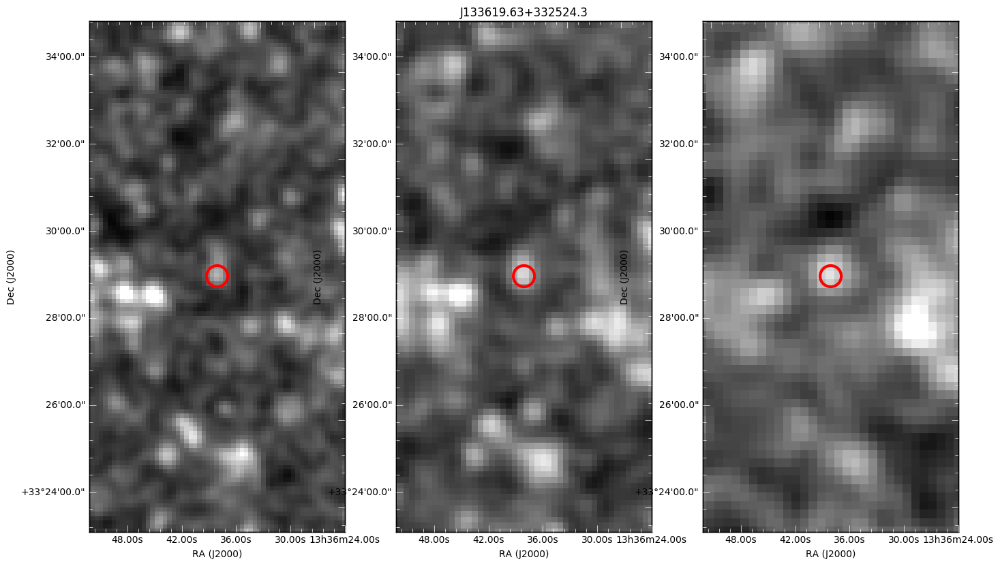

In [12]:
a = 2
# For each figure, load it in and re-centre at the position of the lens candidate

fig = plt.figure(figsize=(15,15))

fig1 = aplpy.FITSFigure(loc_250_NGP, figure=fig, subplot=[0.1,0.1,0.25,0.5])
fig1.recenter(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], radius = radius/60)
fig1.show_grayscale()
fig1.show_markers(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], s= 500, linewidth = 3)

fig2 = aplpy.FITSFigure(loc_350_NGP, figure=fig, subplot=[0.4,0.1,0.25,0.5])
fig2.recenter(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], radius = radius/60)
fig2.show_grayscale()
fig2.show_markers(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], s= 500, linewidth = 3)

fig3 = aplpy.FITSFigure(loc_500_NGP, figure=fig, subplot=[0.7,0.1,0.25,0.5])
fig3.recenter(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], radius = radius/60)
fig3.show_grayscale()
fig3.show_markers(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], s= 500, linewidth = 3)

fig2.set_title(lens_candidates.iloc[a]['SDSS Name'])

INFO: Auto-setting vmin to -2.319e-02 [aplpy.core]
INFO: Auto-setting vmax to  6.127e-02 [aplpy.core]


INFO: Auto-setting vmin to -2.556e-02 [aplpy.core]
INFO: Auto-setting vmax to  5.686e-02 [aplpy.core]


INFO: Auto-setting vmin to -2.779e-02 [aplpy.core]
INFO: Auto-setting vmax to  4.895e-02 [aplpy.core]


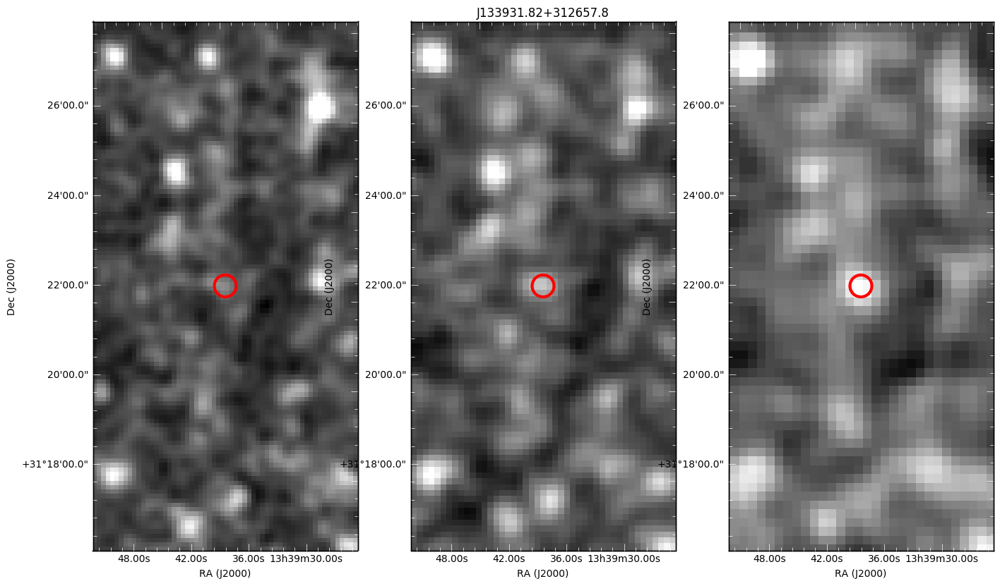

In [13]:
a = 3
# For each figure, load it in and re-centre at the position of the lens candidate

fig = plt.figure(figsize=(15,15))

fig1 = aplpy.FITSFigure(loc_250_NGP, figure=fig, subplot=[0.1,0.1,0.25,0.5])
fig1.recenter(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], radius = radius/60)
fig1.show_grayscale()
fig1.show_markers(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], s= 500, linewidth = 3)

fig2 = aplpy.FITSFigure(loc_350_NGP, figure=fig, subplot=[0.4,0.1,0.25,0.5])
fig2.recenter(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], radius = radius/60)
fig2.show_grayscale()
fig2.show_markers(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], s= 500, linewidth = 3)

fig3 = aplpy.FITSFigure(loc_500_NGP, figure=fig, subplot=[0.7,0.1,0.25,0.5])
fig3.recenter(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], radius = radius/60)
fig3.show_grayscale()
fig3.show_markers(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], s= 500, linewidth = 3)

fig2.set_title(lens_candidates.iloc[a]['SDSS Name'])

INFO: Auto-setting vmin to -2.319e-02 [aplpy.core]
INFO: Auto-setting vmax to  6.127e-02 [aplpy.core]


INFO: Auto-setting vmin to -2.556e-02 [aplpy.core]
INFO: Auto-setting vmax to  5.686e-02 [aplpy.core]


INFO: Auto-setting vmin to -2.779e-02 [aplpy.core]
INFO: Auto-setting vmax to  4.895e-02 [aplpy.core]


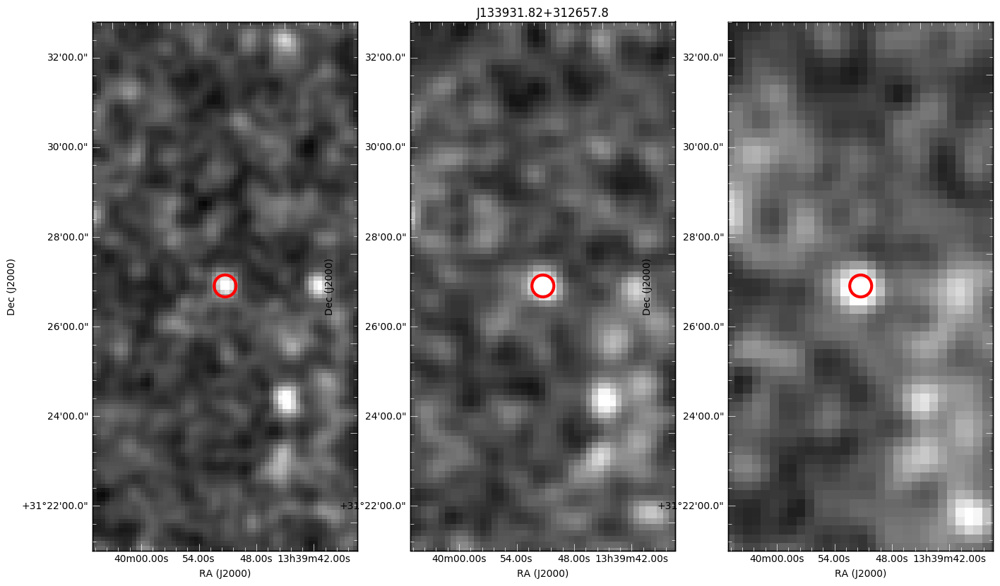

In [14]:
a = 4
# For each figure, load it in and re-centre at the position of the lens candidate

fig = plt.figure(figsize=(15,15))

fig1 = aplpy.FITSFigure(loc_250_NGP, figure=fig, subplot=[0.1,0.1,0.25,0.5])
fig1.recenter(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], radius = radius/60)
fig1.show_grayscale()
fig1.show_markers(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], s= 500, linewidth = 3)

fig2 = aplpy.FITSFigure(loc_350_NGP, figure=fig, subplot=[0.4,0.1,0.25,0.5])
fig2.recenter(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], radius = radius/60)
fig2.show_grayscale()
fig2.show_markers(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], s= 500, linewidth = 3)

fig3 = aplpy.FITSFigure(loc_500_NGP, figure=fig, subplot=[0.7,0.1,0.25,0.5])
fig3.recenter(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], radius = radius/60)
fig3.show_grayscale()
fig3.show_markers(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], s= 500, linewidth = 3)

fig2.set_title(lens_candidates.iloc[a]['SDSS Name'])

INFO: Auto-setting vmin to -2.319e-02 [aplpy.core]
INFO: Auto-setting vmax to  6.127e-02 [aplpy.core]


INFO: Auto-setting vmin to -2.556e-02 [aplpy.core]
INFO: Auto-setting vmax to  5.686e-02 [aplpy.core]


INFO: Auto-setting vmin to -2.779e-02 [aplpy.core]
INFO: Auto-setting vmax to  4.895e-02 [aplpy.core]


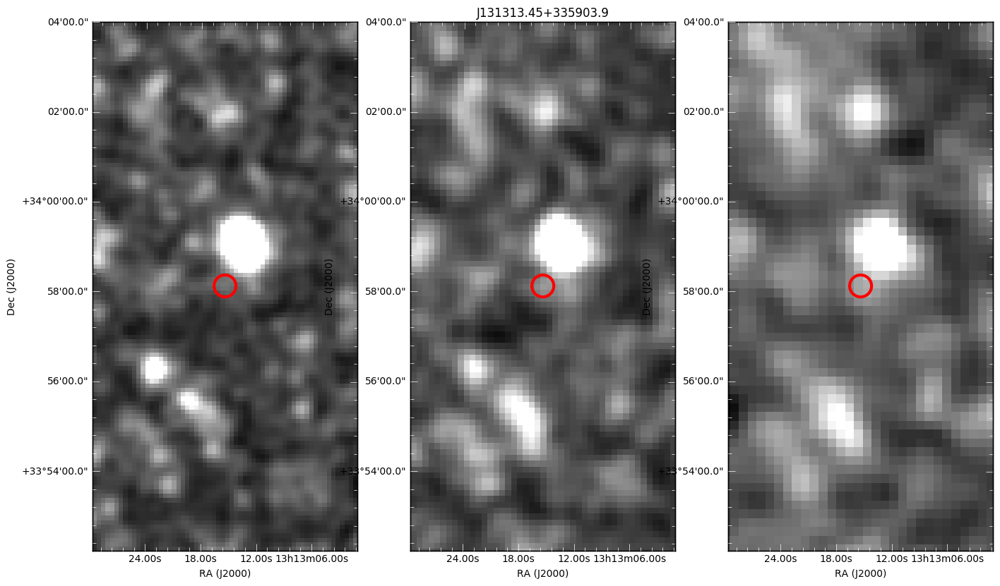

In [15]:
a = 5
# For each figure, load it in and re-centre at the position of the lens candidate

fig = plt.figure(figsize=(15,15))

fig1 = aplpy.FITSFigure(loc_250_NGP, figure=fig, subplot=[0.1,0.1,0.25,0.5])
fig1.recenter(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], radius = radius/60)
fig1.show_grayscale()
fig1.show_markers(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], s= 500, linewidth = 3)

fig2 = aplpy.FITSFigure(loc_350_NGP, figure=fig, subplot=[0.4,0.1,0.25,0.5])
fig2.recenter(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], radius = radius/60)
fig2.show_grayscale()
fig2.show_markers(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], s= 500, linewidth = 3)

fig3 = aplpy.FITSFigure(loc_500_NGP, figure=fig, subplot=[0.7,0.1,0.25,0.5])
fig3.recenter(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], radius = radius/60)
fig3.show_grayscale()
fig3.show_markers(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'], s= 500, linewidth = 3)

fig2.set_title(lens_candidates.iloc[a]['SDSS Name'])

# Extracting the Herschel Flux

In [16]:
from astropy.io import fits
from astropy.wcs import WCS

# Make sure we're getting our candidates

lens_candidates = my_table.loc[lens_indexes]


# Add in some new columns to out lens candidates dataframe
lens_candidates['F250'] = 0
lens_candidates['F350'] = 0
lens_candidates['F500'] = 0


# For all of our lens candidates, we extract the 250, 350 and 500 um flux at the positions of the lenses
# DONT TRUST THE NGP UNTIL MATCHED FILTER HAS BEEN OBTAINED
for a in np.arange(6):
    
    
    # 250
    if a >= 2:
        data = fits.getdata(loc_250_NGP)
        wcs = WCS(loc_250_NGP)
    else: 
        data = fits.getdata(loc_250_G15)
        wcs = WCS(loc_250_G15)
    
    ra,dec = wcs.all_world2pix(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'],0)
    
    
    # Add this to our tables
    lens_candidates.iloc[a, lens_candidates.columns.get_loc('F250')] =  1000*data[np.round(dec),np.round(ra)]
    
    
    #350
    if a >= 2:
        data = fits.getdata(loc_350_NGP)
        wcs = WCS(loc_350_NGP)
    else: 
        data = fits.getdata(loc_350_G15)
        wcs = WCS(loc_350_G15)
    
    ra,dec = wcs.all_world2pix(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'],0)
       
    # Add this to our tables
    lens_candidates.iloc[a, lens_candidates.columns.get_loc('F350')] =  1000*data[np.round(dec),np.round(ra)]
    
    #500
    if a >= 2:
        data = fits.getdata(loc_500_NGP)
        wcs = WCS(loc_500_NGP)
    else: 
        data = fits.getdata(loc_500_G15)
        wcs = WCS(loc_500_G15)
    
    ra,dec = wcs.all_world2pix(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'],0)
    
    # Add this to our tables
    lens_candidates.iloc[a, lens_candidates.columns.get_loc('F500')] =  1000*data[np.round(dec),np.round(ra)]
    
 

/home/jgreenslade/.local/lib/python3.5/site-packages/ipykernel/__main__.py:32: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/jgreenslade/.local/lib/python3.5/site-packages/ipykernel/__main__.py:46: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/jgreenslade/.local/lib/python3.5/site-packages/ipykernel/__main__.py:59: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


In [17]:
lens_candidates

,DEC,Max SNR,N_Pix,RA,SDSS Name,XPixel,YPixel,F250,F350,F500
39,-0.581499,5.666081,9,219.256393,J143643.42-003401.3,63,108,1.727268,9.758262,20.253599
40,-0.573722,5.191000,10,219.216391,J143643.42-003401.3,99,115,58.958020,46.942439,38.047839
17,33.485639,5.457885,8,204.164265,J133619.63+332524.3,72,185,36.943208,42.914260,40.660270
36,31.369412,7.281829,13,204.916334,J133931.82+312657.8,112,57,20.907236,38.688373,53.037647
35,31.451609,12.116039,21,204.969765,J133931.82+312657.8,71,131,69.451153,80.739938,64.957269
31,33.968889,6.350033,9,198.314289,J131313.45+335903.9,128,115,15.802881,24.023466,21.738533


# Extracting SCUBA2 Fluxes

In [18]:
lens_candidates['F850'] = 0


# For all of our lens candidates, we extract the 250, 350 and 500 um flux at the positions of the lenses
# DONT TRUST THE NGP UNTIL MATCHED FILTER HAS BEEN OBTAINED
for a in np.arange(6):
    
    name  = lens_candidates.iloc[a]['SDSS Name']
    loc = '/media/jgreenslade/New Volume/PhD/Projects/Jingle/Data/Background_Sources/' + name + '/zero-mask_mf.fits'

    data = fits.getdata(loc)
    data = data[0]
    wcs = WCS(loc)

    
    ra,dec, na  = wcs.all_world2pix(lens_candidates.iloc[a]['RA'], lens_candidates.iloc[a]['DEC'],0,0)
    
    
    # Add this to our tables
    lens_candidates.iloc[a, lens_candidates.columns.get_loc('F850')] =  1000*537*data[np.round(dec),np.round(ra)]
    
    # The above data is converted from pW into mJy/beam by the FCF factor
    # of 537, and then a Jy->mJy converstion of 1000
 

/home/jgreenslade/.local/lib/python3.5/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


# Photo-z Fits to the sources

In [27]:
lens_candidates

,DEC,Max SNR,N_Pix,RA,SDSS Name,XPixel,YPixel,F250,F350,F500,F850
39,-0.581499,5.666081,9,219.256393,J143643.42-003401.3,63,108,1.727268,9.758262,20.253599,14.658530
40,-0.573722,5.191000,10,219.216391,J143643.42-003401.3,99,115,58.958020,46.942439,38.047839,9.247744
17,33.485639,5.457885,8,204.164265,J133619.63+332524.3,72,185,36.943208,42.914260,40.660270,16.558949
36,31.369412,7.281829,13,204.916334,J133931.82+312657.8,112,57,20.907236,38.688373,53.037647,20.435917
35,31.451609,12.116039,21,204.969765,J133931.82+312657.8,71,131,69.451153,80.739938,64.957269,27.609030
31,33.968889,6.350033,9,198.314289,J131313.45+335903.9,128,115,15.802881,24.023466,21.738533,8.774459


The following images will be in the order of the table.

I did not know the error on any of these measurments, so assumed a 250, 350 500 and 850 error of 6, 7, 8 and 2.5 mJy.

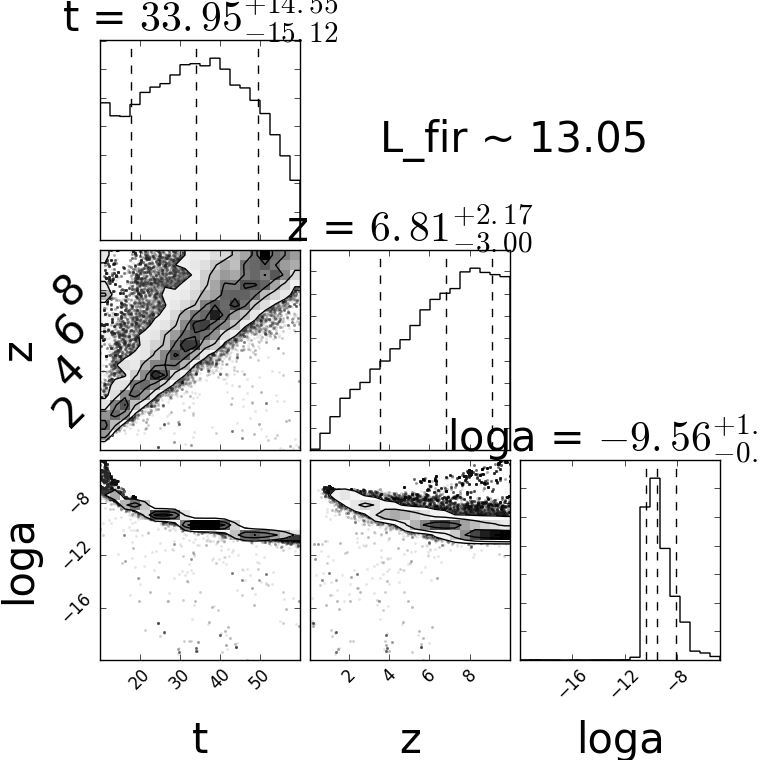

In [28]:
from IPython.display import Image
Image("/media/jgreenslade/New Volume/PhD/Projects/Jingle/Survey_Paper/InterestingBackground/J143_0.png")

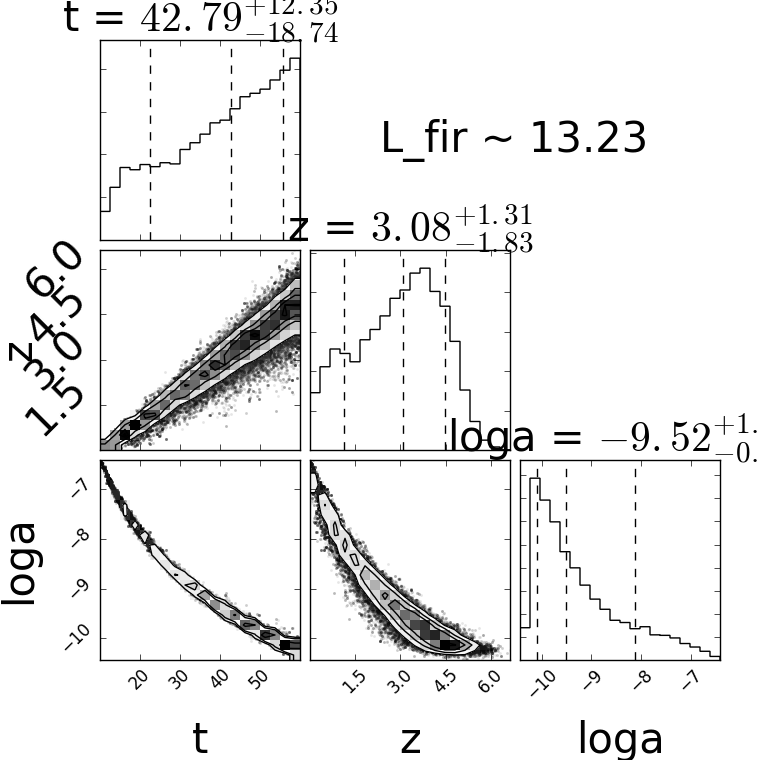

In [29]:
from IPython.display import Image
Image("/media/jgreenslade/New Volume/PhD/Projects/Jingle/Survey_Paper/InterestingBackground/J143_1.png")

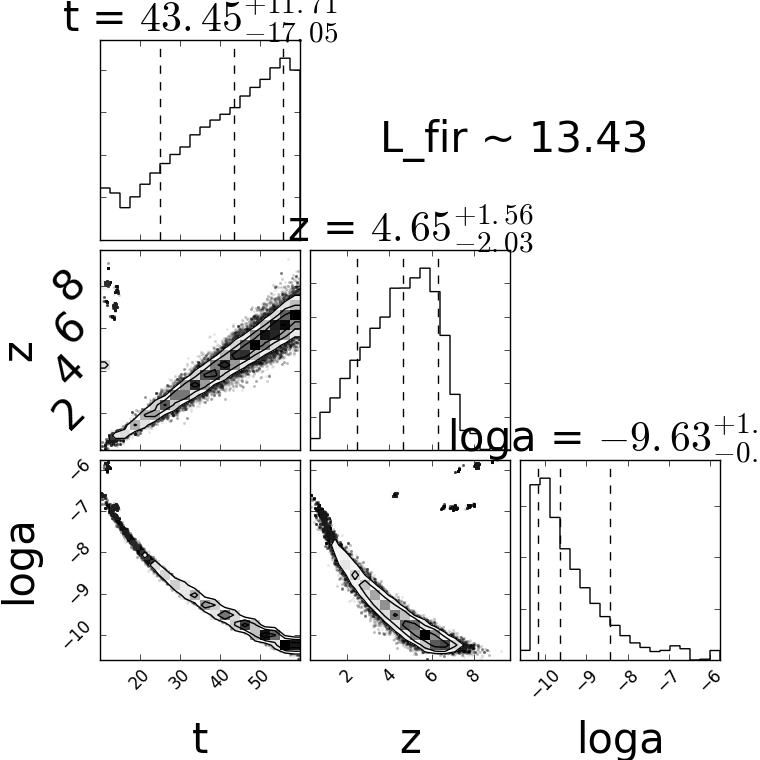

In [30]:
from IPython.display import Image
Image("/media/jgreenslade/New Volume/PhD/Projects/Jingle/Survey_Paper/InterestingBackground/J1336_0.png")

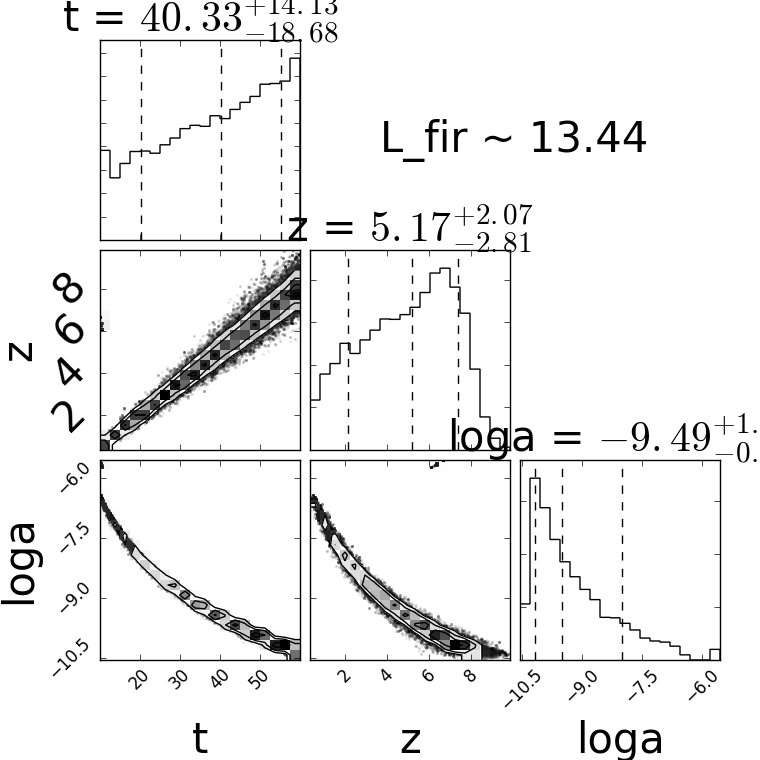

In [31]:
from IPython.display import Image
Image("/media/jgreenslade/New Volume/PhD/Projects/Jingle/Survey_Paper/InterestingBackground/J1339_0.png")

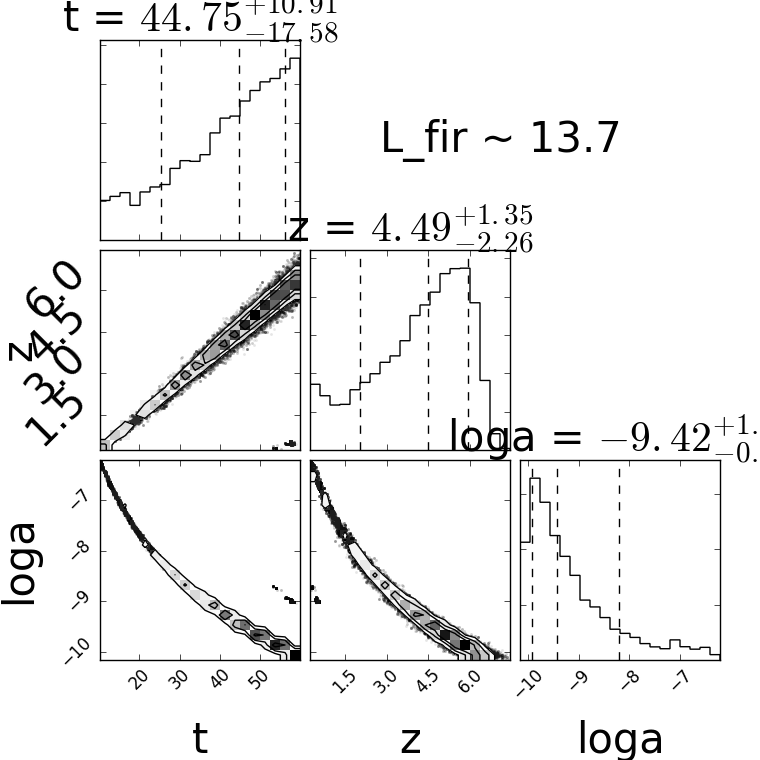

In [32]:
from IPython.display import Image
Image("/media/jgreenslade/New Volume/PhD/Projects/Jingle/Survey_Paper/InterestingBackground/J1339_1.png")

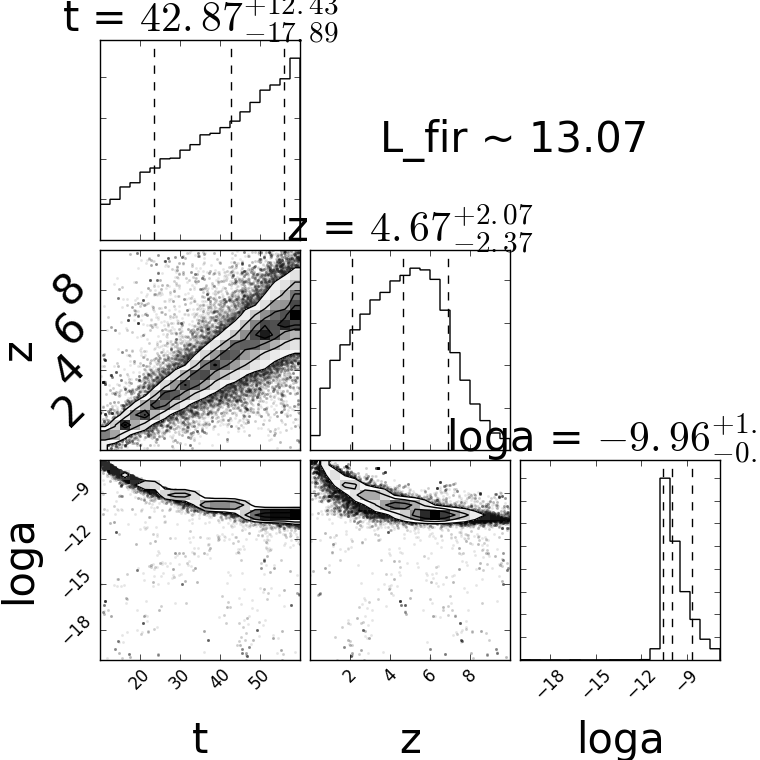

In [33]:
from IPython.display import Image
Image("/media/jgreenslade/New Volume/PhD/Projects/Jingle/Survey_Paper/InterestingBackground/J131_0.png")

In [34]:
from IPython.display import HTML
import pandas as pd
data = pd.DataFrame({'spam':['ham','green','five',0,'kitties'],
                     'eggs':[0,1,2,3,4]})
h = HTML(lens_candidates.to_html())
h
my_file = open('/media/jgreenslade/New Volume/PhD/Projects/Jingle/Survey_Paper/InterestingBackground/table.html', 'w')
my_file.write(h.data)
my_file.close()